In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pickle
import os
import keras
import copy
import tensorflow as tf
import pandas as pd
import keras.backend as K
from keras.models import Sequential
from keras.layers.core import Activation, Dense
from keras.layers import Flatten, LSTM, Masking
from keras.models import Model
from keras.layers import Input
from model_helper import *
from DeepRouteSetHelper import *

Using TensorFlow backend.


## 1. Load in dataset

### 1-1. load original dataset

In [2]:
cwd = os.getcwd()
parent_wd = cwd.replace('/model', '')
raw_path = parent_wd + '/out/MediumProblemOfDeepRouteSet_v1'

In [3]:
with open(raw_path, 'rb') as f:
    raw_gen_set = pickle.load(f)

### 1-2. Preprocessing and normalization

In [4]:
test_set = convert_generated_data_into_test_set(raw_gen_set, parent_wd + '/preprocessing/test_set_medium_gen_v1')

In [5]:
X_test = test_set['X']

## 2. Define GradeNet Model

In [6]:
np.random.seed(0)
tf.random.set_seed(0)
inputs = Input(shape = (12, 22))
mask = Masking(mask_value = 0.).compute_mask(inputs)
lstm0 = LSTM(20, activation='tanh', input_shape=(12, 22), kernel_initializer='glorot_normal', return_sequences = 'True')(
    inputs, mask = mask)
dense1 = Dense(100, activation='relu', kernel_initializer='glorot_normal')(lstm0)
dense2 = Dense(80, activation='relu', kernel_initializer='glorot_normal')(dense1)
dense3 = Dense(75, activation='relu', kernel_initializer='glorot_normal')(dense2)
dense4 = Dense(50, activation='relu', kernel_initializer='glorot_normal')(dense3)
dense5 = Dense(20, activation='relu', kernel_initializer='glorot_normal')(dense4)
dense6 = Dense(10, activation='relu', kernel_initializer='glorot_normal')(dense5)
flat = Flatten()(dense6)
softmax2 = Dense(10, activation='softmax', name = 'softmax2')(flat)
lstm1 = LSTM(20, activation='tanh', kernel_initializer='glorot_normal', return_sequences = True)(dense6)
lstm2 = LSTM(20, activation='tanh', kernel_initializer='glorot_normal')(lstm1)
dense7 = Dense(15, activation='relu', kernel_initializer='glorot_normal', name = 'dense7')(lstm2)
dense8 = Dense(15, activation='relu', kernel_initializer='glorot_normal', name = 'dense8')(dense7)
softmax3 = Dense(10, activation='softmax', name = 'softmax2')(dense8)

def custom_loss(layer):
    def loss(y_true,y_pred):
        loss1 = K.sparse_categorical_crossentropy(y_true, y_pred)
        loss2 = K.sparse_categorical_crossentropy(y_true, layer)
        return K.mean(loss1 + loss2, axis=-1)
    return loss

GradeNet = Model(inputs=[inputs], outputs=[softmax3])
GradeNet.compile(optimizer='adam', 
                loss=custom_loss(softmax2),
                metrics=['sparse_categorical_accuracy'])

### load pretrained model

In [7]:
# load model weight
GradeNet.load_weights(parent_wd + '/model/GradeNet.h5')

## 3. Make prediction on generated routes

In [8]:
test_Y_gen = GradeNet.predict(X_test).argmax(axis = 1)

In [9]:
test_Y_gen

array([2, 1, 1, 2, 2, 3, 2, 2, 3, 1, 2, 2, 3, 4, 0, 1, 5, 0, 0, 1, 2, 2,
       2, 3, 2, 2, 2, 1, 1, 1, 2, 2, 2, 2, 2, 1, 0, 2, 0, 5, 3, 0, 1, 0,
       2, 4, 0, 2, 1, 1, 1, 4, 3, 1, 2, 1, 1, 3, 2, 4, 2, 2, 4, 2, 1])

## 4. Plot out output and predicted grade

In [10]:
seq_raw_path = parent_wd + '/out/MediumProblemSequenceOfDeepRouteSet_v1'
with open(seq_raw_path, 'rb') as f:
    gen_seq_raw = pickle.load(f)

Key = MediumDeepRouteSet_v1_id1
V grade = V6


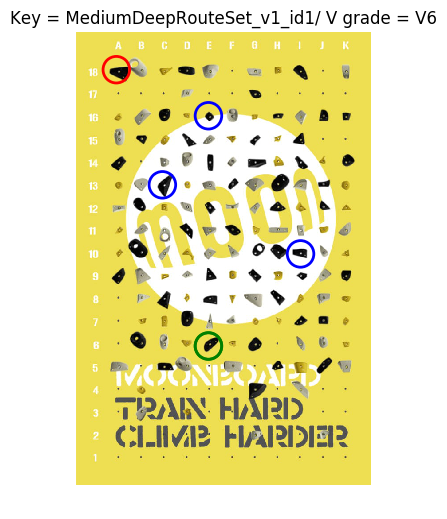

Key = MediumDeepRouteSet_v1_id2
V grade = V5


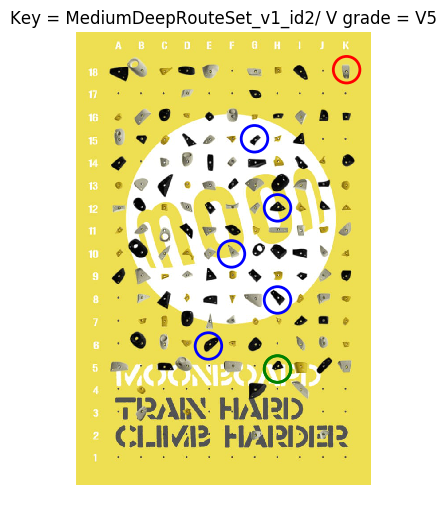

Key = MediumDeepRouteSet_v1_id3
V grade = V5


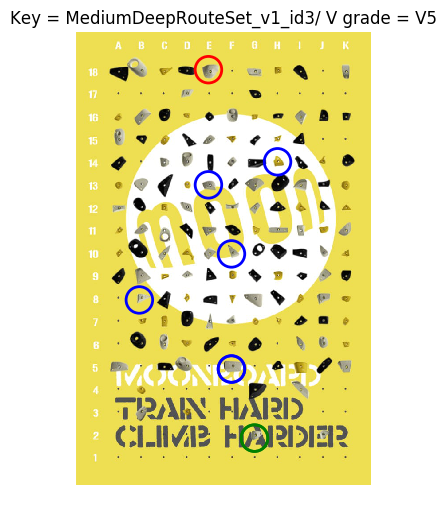

Key = MediumDeepRouteSet_v1_id4
V grade = V6


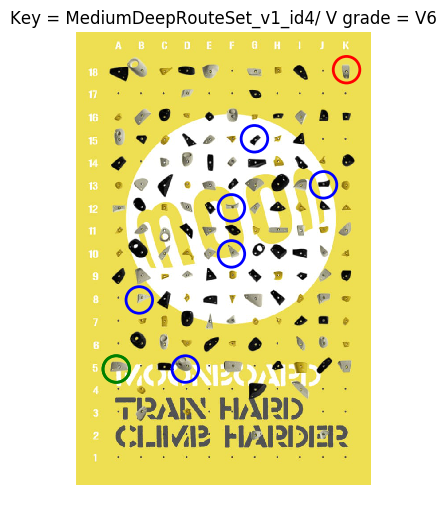

Key = MediumDeepRouteSet_v1_id5
V grade = V6


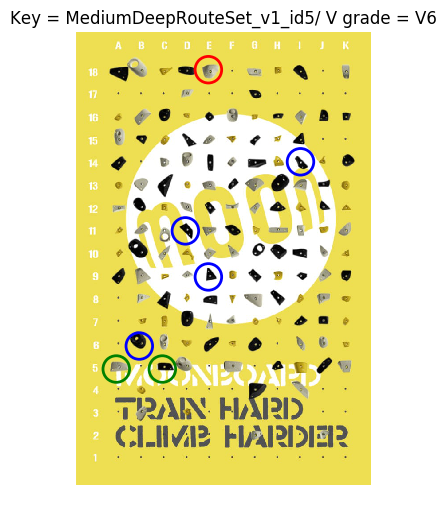

Key = MediumDeepRouteSet_v1_id6
V grade = V7


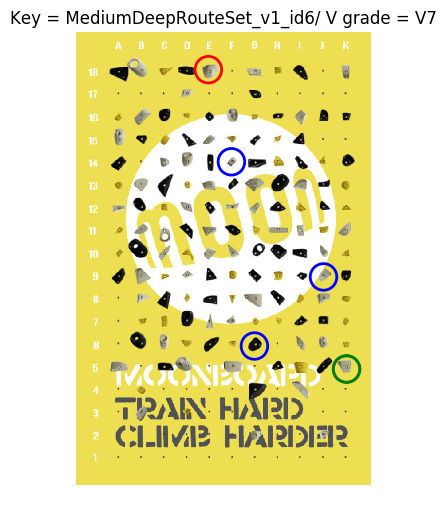

Key = MediumDeepRouteSet_v1_id7
V grade = V6


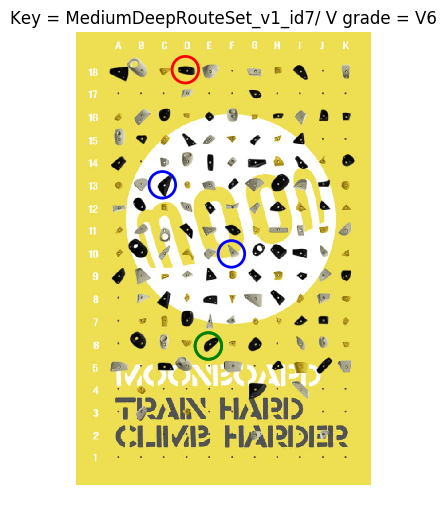

Key = MediumDeepRouteSet_v1_id8
V grade = V6


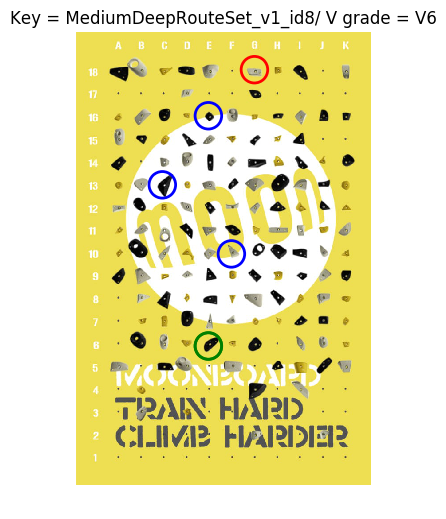

Key = MediumDeepRouteSet_v1_id9
V grade = V7


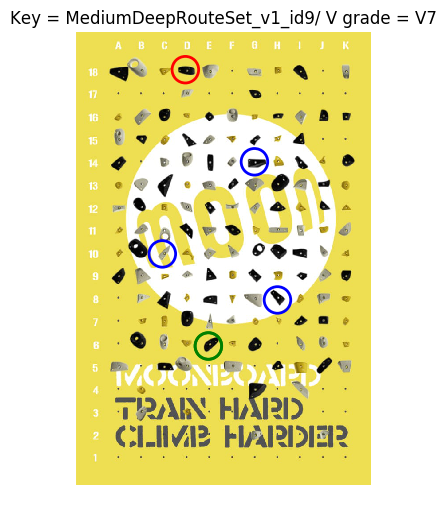

Key = MediumDeepRouteSet_v1_id10
V grade = V5


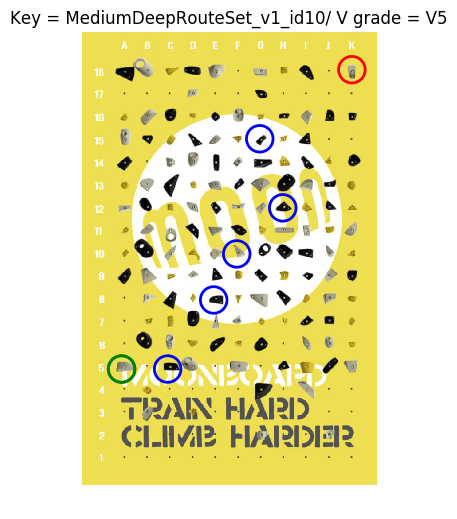

Key = MediumDeepRouteSet_v1_id11
V grade = V6


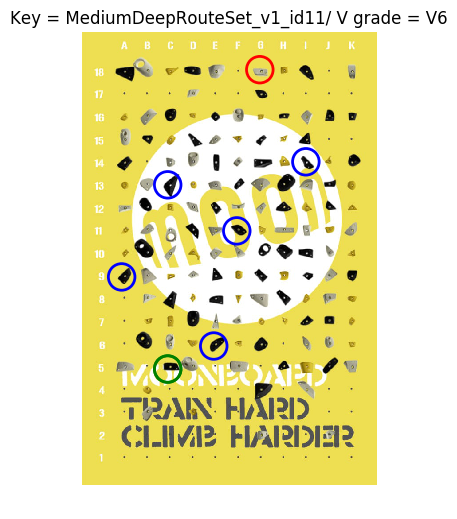

Key = MediumDeepRouteSet_v1_id12
V grade = V6


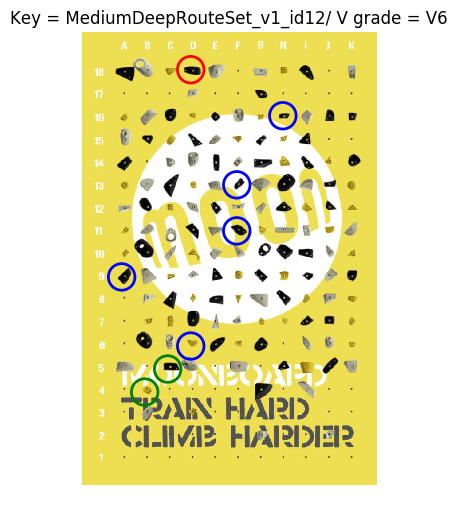

Key = MediumDeepRouteSet_v1_id13
V grade = V7


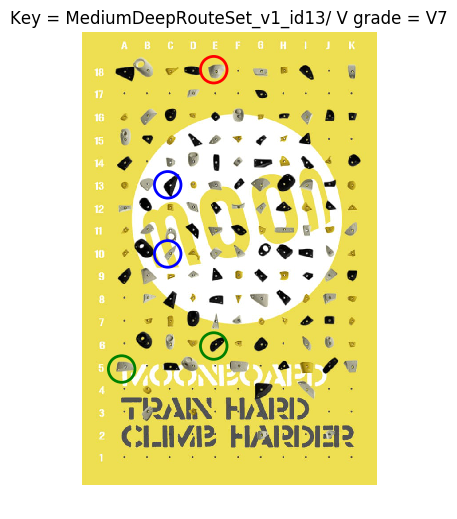

Key = MediumDeepRouteSet_v1_id14
V grade = V8


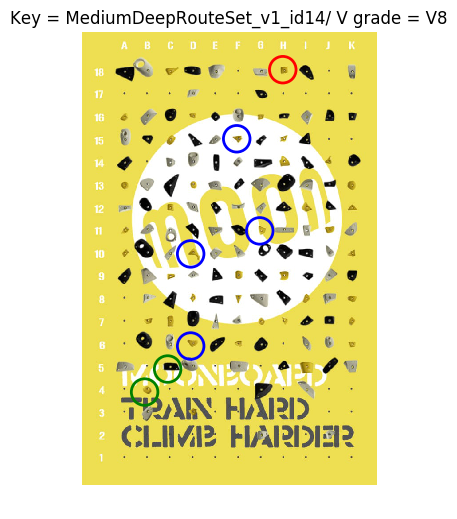

Key = MediumDeepRouteSet_v1_id15
V grade = V4


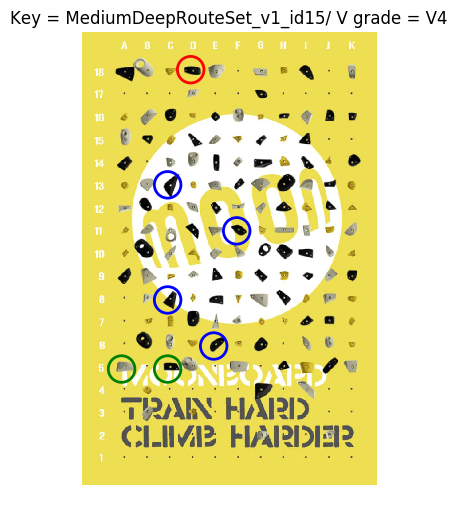

Key = MediumDeepRouteSet_v1_id16
V grade = V5


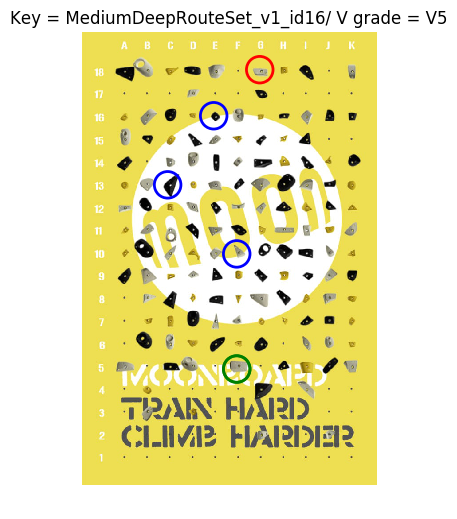

Key = MediumDeepRouteSet_v1_id17
V grade = V9


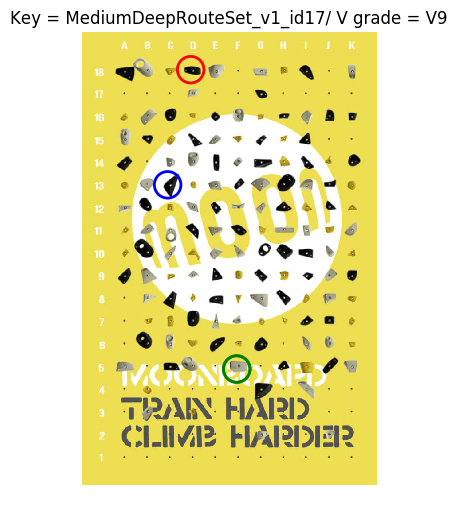

Key = MediumDeepRouteSet_v1_id18
V grade = V4


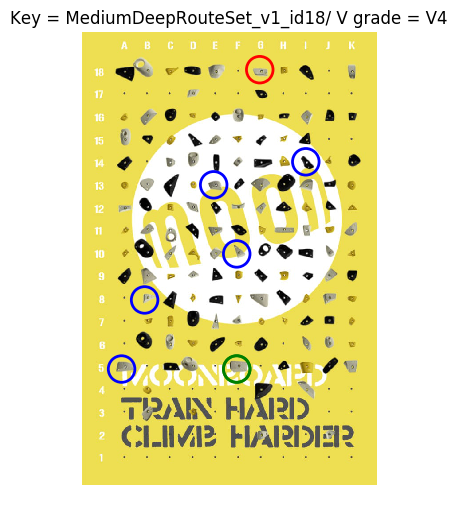

Key = MediumDeepRouteSet_v1_id19
V grade = V4


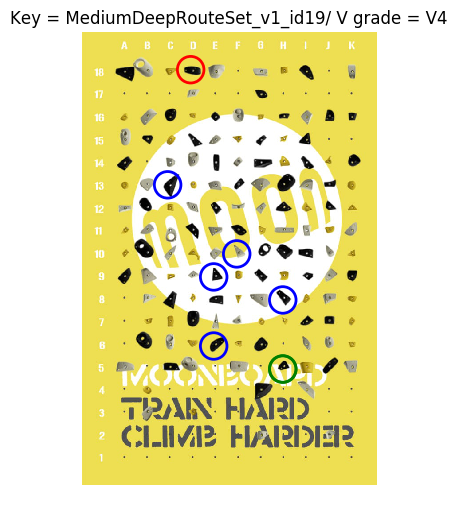

Key = MediumDeepRouteSet_v1_id20
V grade = V5


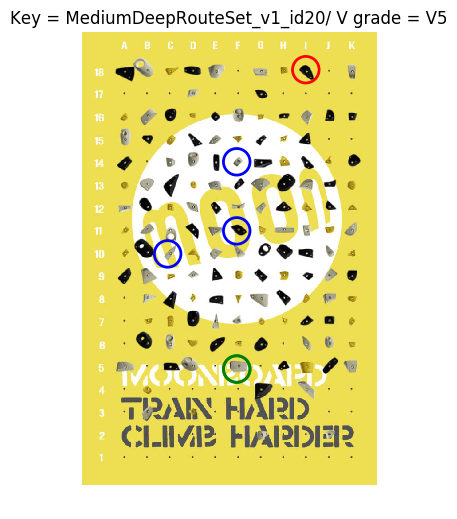

Key = MediumDeepRouteSet_v1_id21
V grade = V6


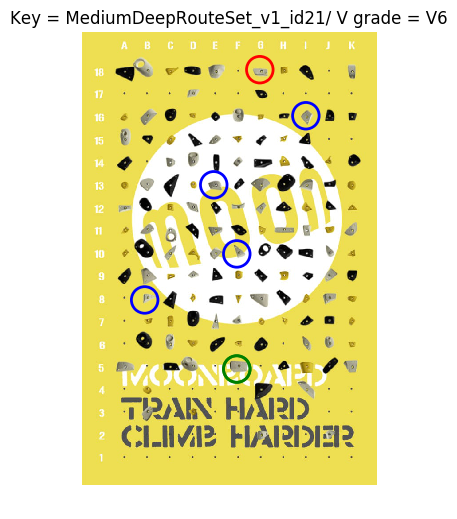

Key = MediumDeepRouteSet_v1_id22
V grade = V6


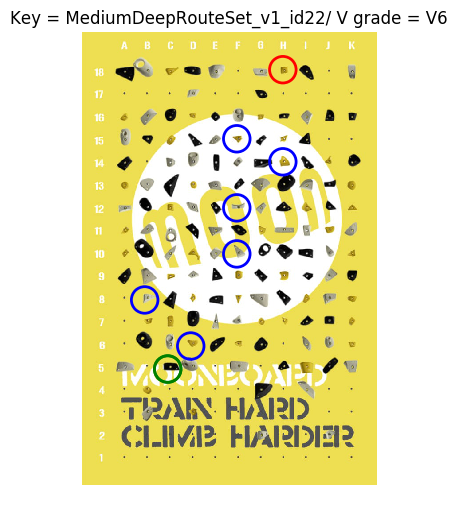

Key = MediumDeepRouteSet_v1_id23
V grade = V6


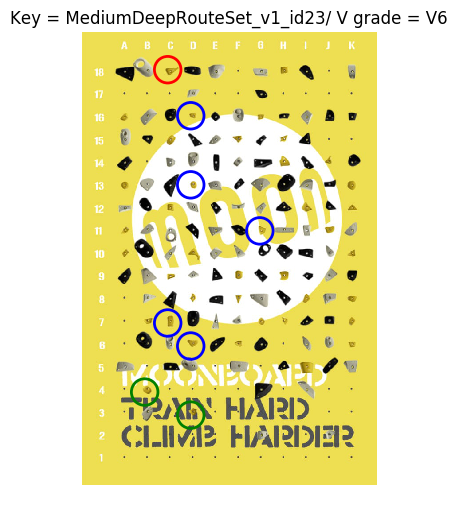

Key = MediumDeepRouteSet_v1_id24
V grade = V7


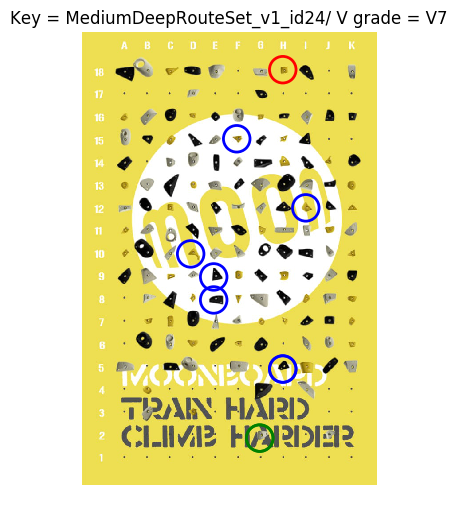

Key = MediumDeepRouteSet_v1_id25
V grade = V6


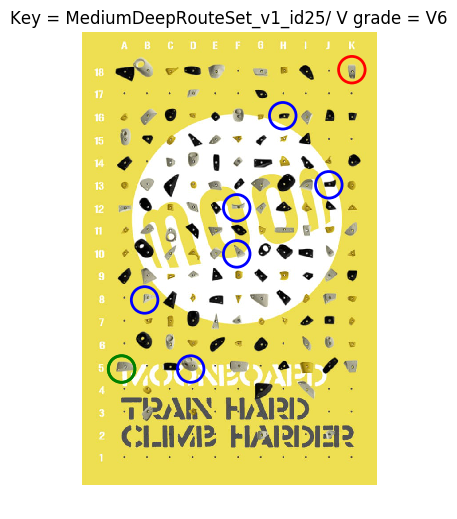

Key = MediumDeepRouteSet_v1_id26
V grade = V6


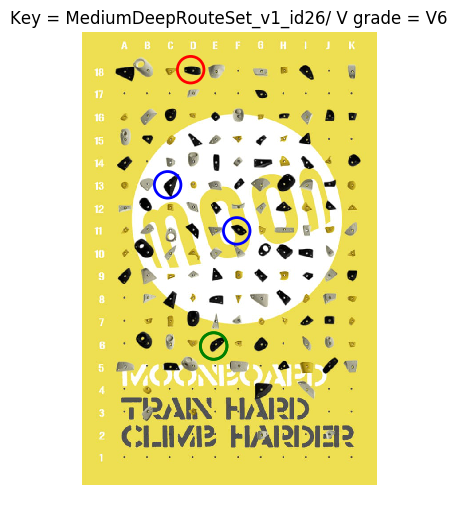

Key = MediumDeepRouteSet_v1_id27
V grade = V6


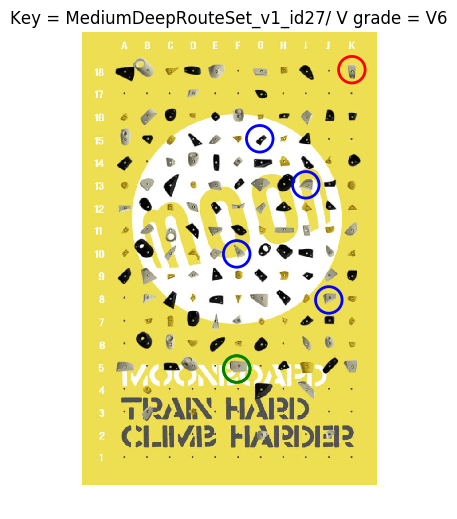

Key = MediumDeepRouteSet_v1_id28
V grade = V5


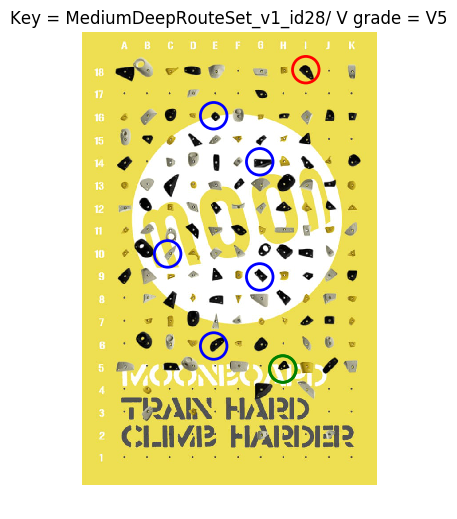

Key = MediumDeepRouteSet_v1_id29
V grade = V5


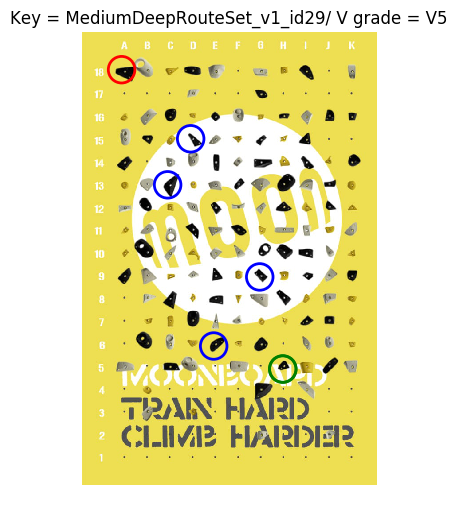

Key = MediumDeepRouteSet_v1_id30
V grade = V5


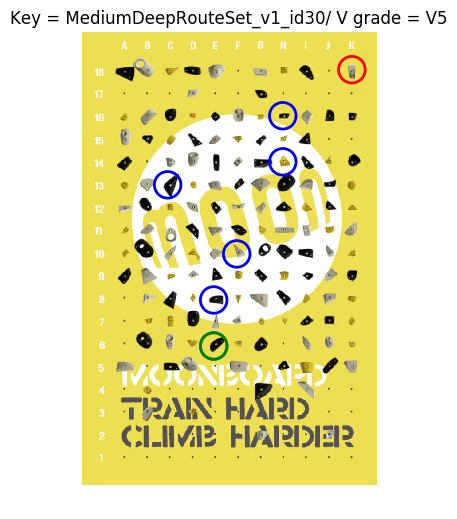

Key = MediumDeepRouteSet_v1_id31
V grade = V6


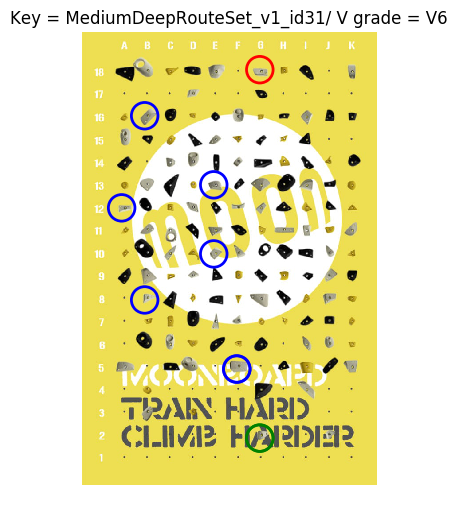

Key = MediumDeepRouteSet_v1_id32
V grade = V6


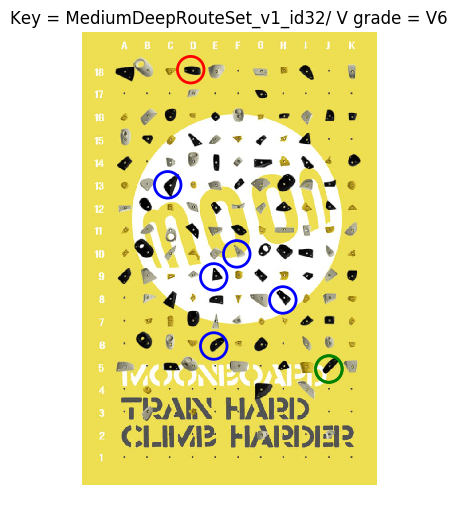

Key = MediumDeepRouteSet_v1_id33
V grade = V6


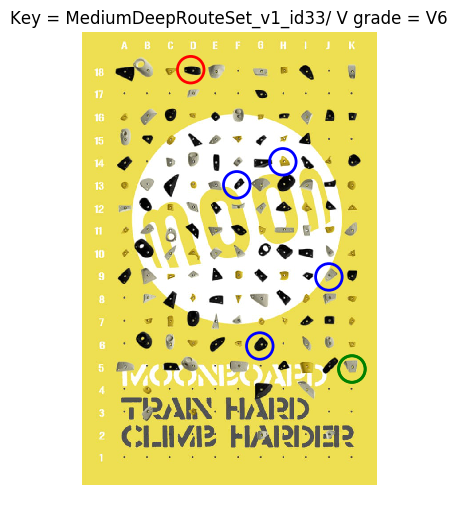

Key = MediumDeepRouteSet_v1_id34
V grade = V6


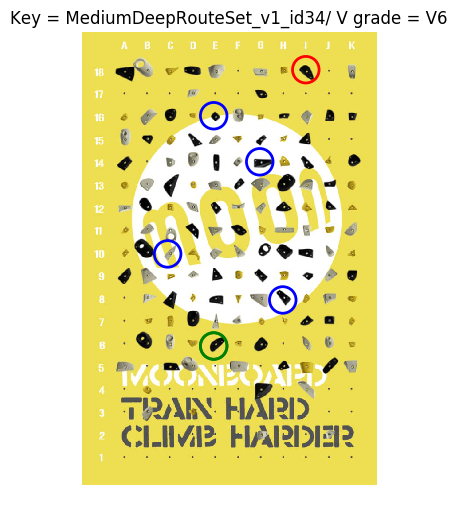

Key = MediumDeepRouteSet_v1_id35
V grade = V6


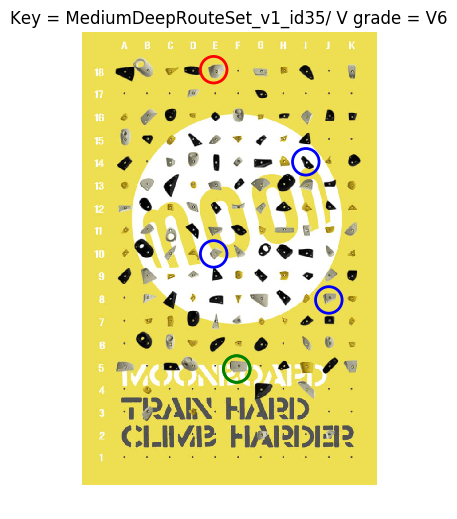

Key = MediumDeepRouteSet_v1_id36
V grade = V5


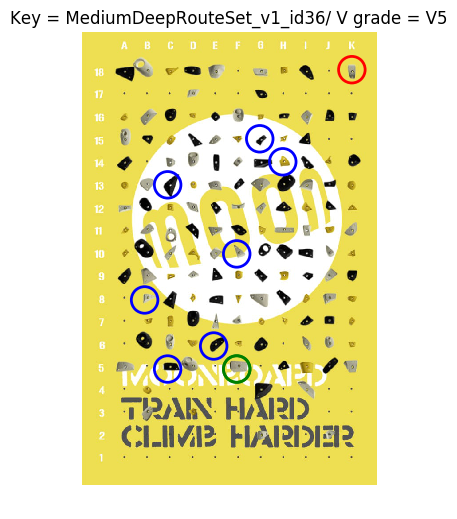

Key = MediumDeepRouteSet_v1_id37
V grade = V4


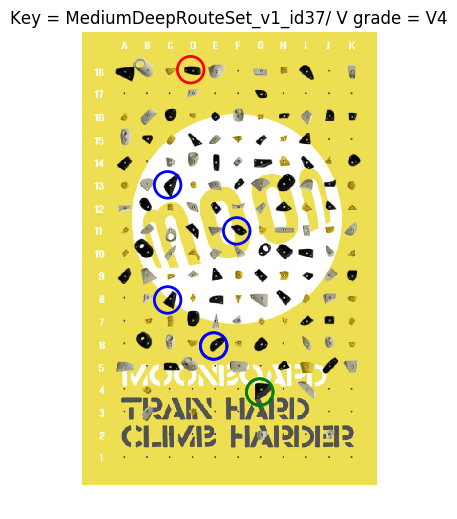

Key = MediumDeepRouteSet_v1_id38
V grade = V6


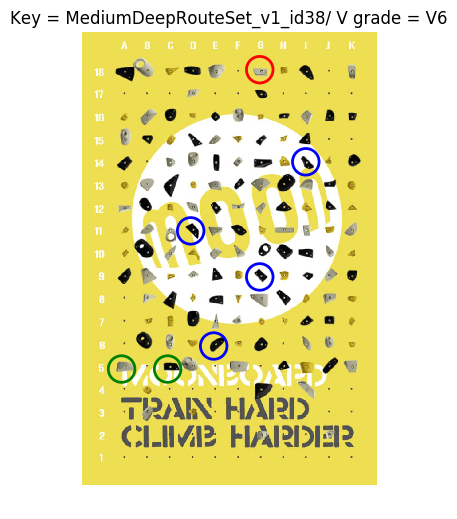

Key = MediumDeepRouteSet_v1_id39
V grade = V4


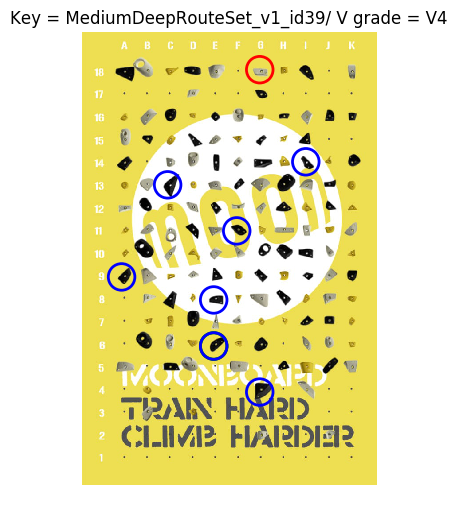

Key = MediumDeepRouteSet_v1_id40
V grade = V9


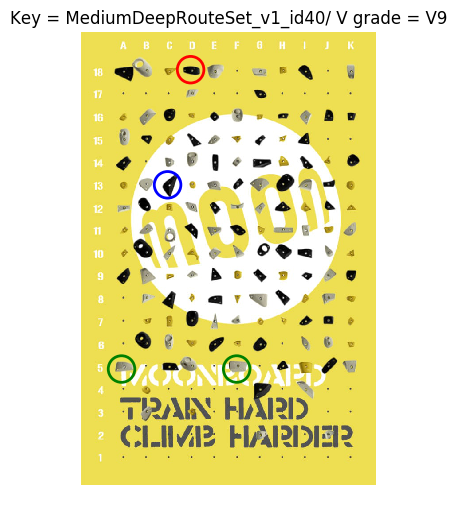

Key = MediumDeepRouteSet_v1_id41
V grade = V7


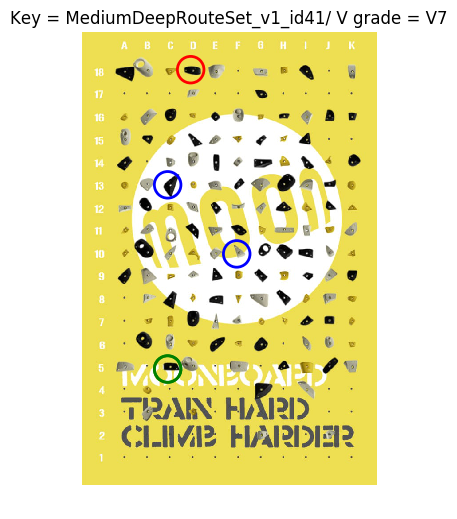

Key = MediumDeepRouteSet_v1_id42
V grade = V4


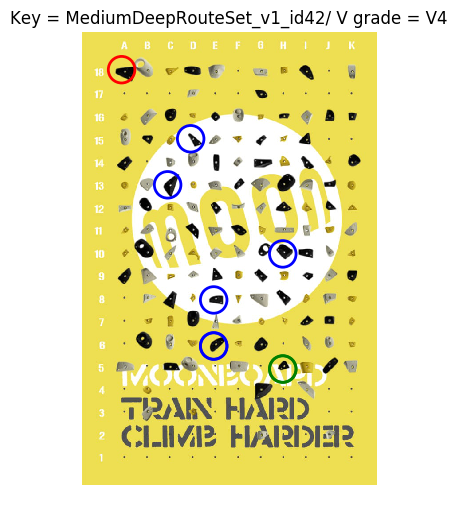

Key = MediumDeepRouteSet_v1_id43
V grade = V5


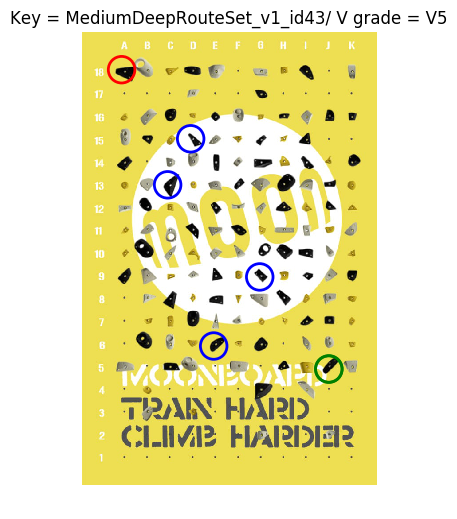

Key = MediumDeepRouteSet_v1_id44
V grade = V4


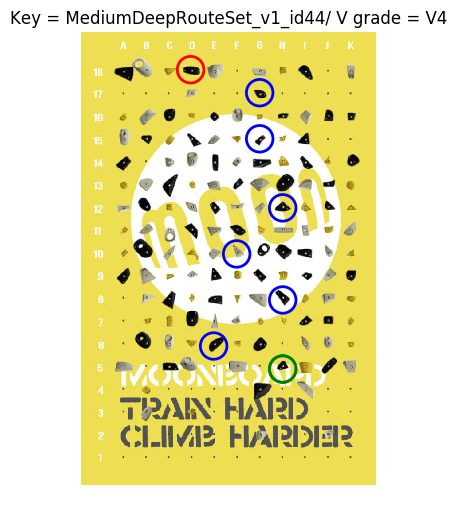

Key = MediumDeepRouteSet_v1_id45
V grade = V6


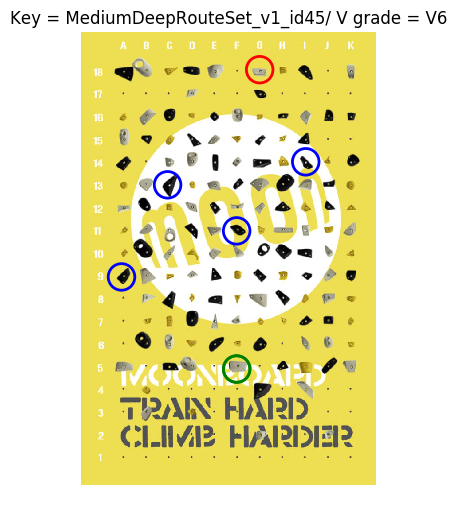

Key = MediumDeepRouteSet_v1_id46
V grade = V8


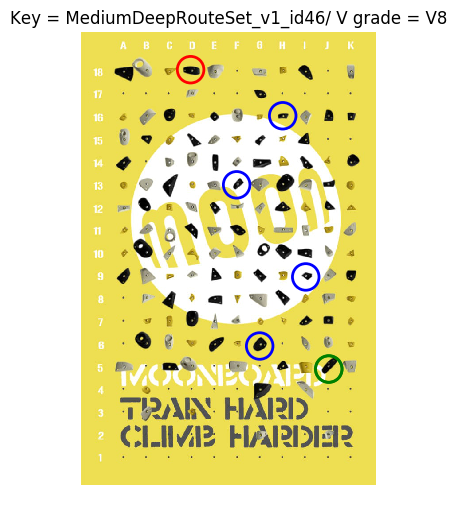

Key = MediumDeepRouteSet_v1_id47
V grade = V4


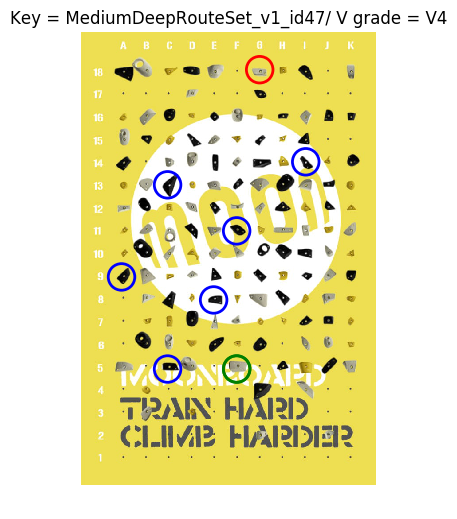

Key = MediumDeepRouteSet_v1_id48
V grade = V6


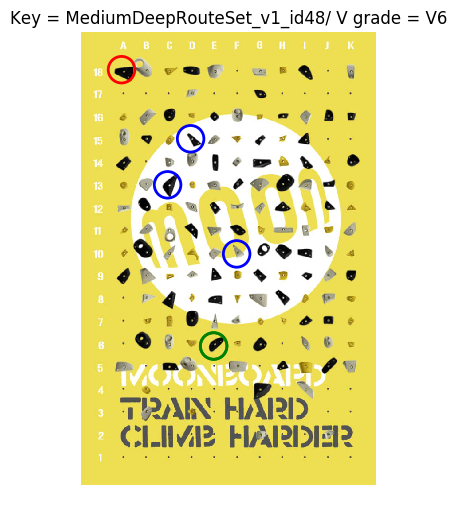

Key = MediumDeepRouteSet_v1_id49
V grade = V5


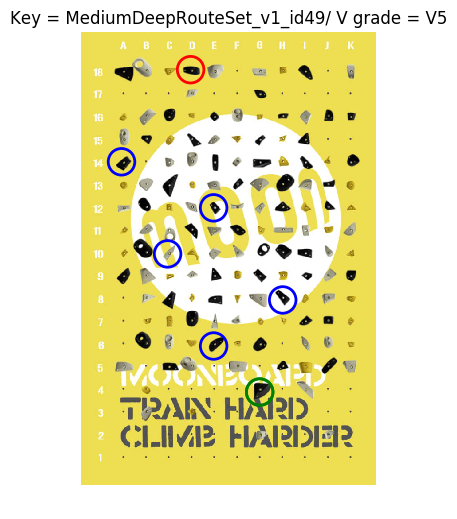

Key = MediumDeepRouteSet_v1_id50
V grade = V5


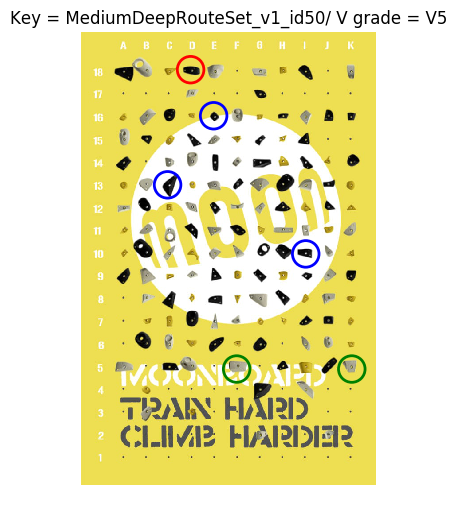

Key = MediumDeepRouteSet_v1_id51
V grade = V5


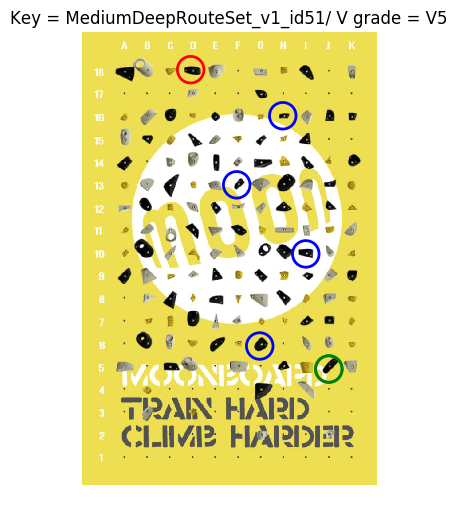

Key = MediumDeepRouteSet_v1_id52
V grade = V8


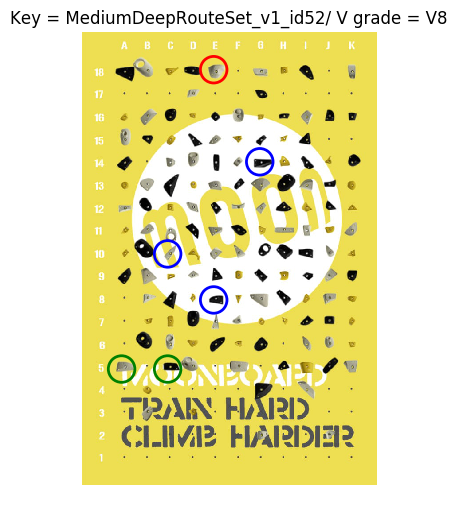

Key = MediumDeepRouteSet_v1_id53
V grade = V7


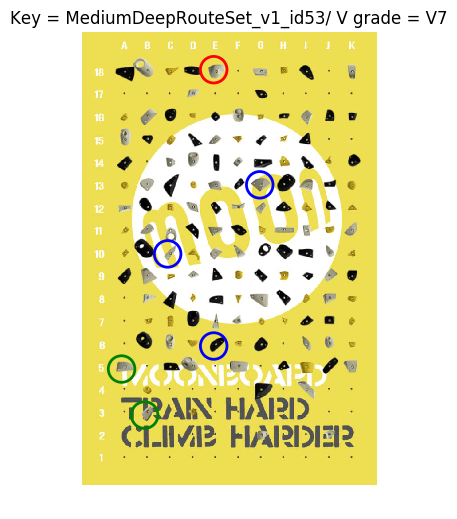

Key = MediumDeepRouteSet_v1_id54
V grade = V5


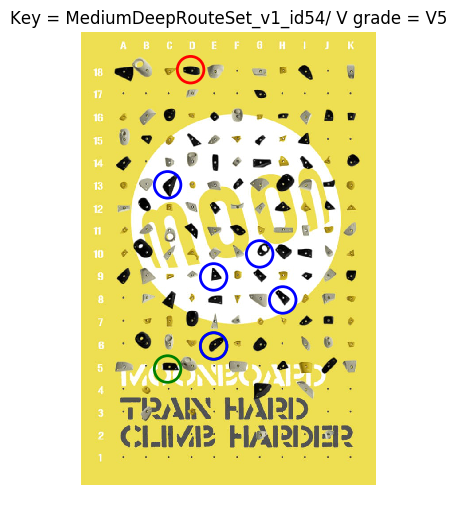

Key = MediumDeepRouteSet_v1_id55
V grade = V6


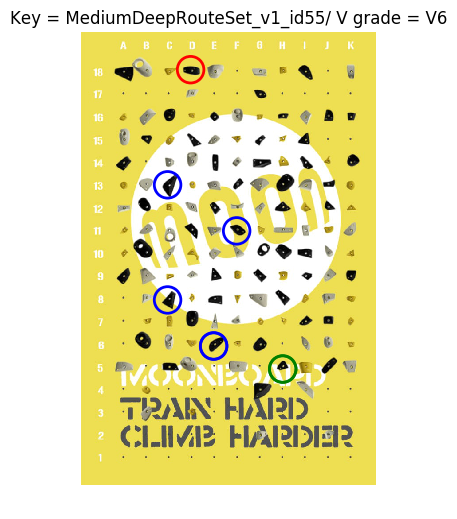

Key = MediumDeepRouteSet_v1_id56
V grade = V5


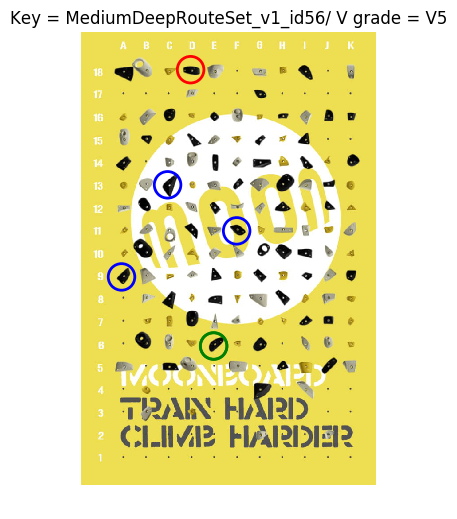

Key = MediumDeepRouteSet_v1_id57
V grade = V5


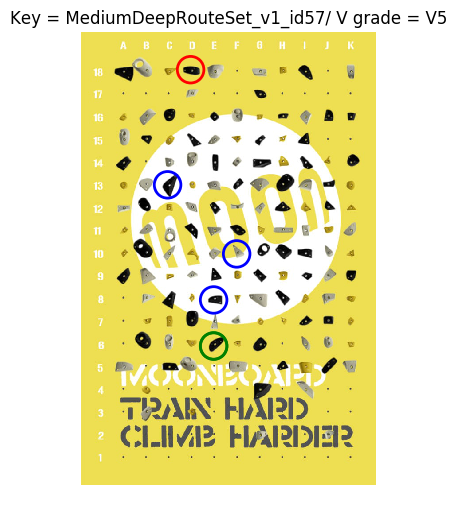

Key = MediumDeepRouteSet_v1_id58
V grade = V7


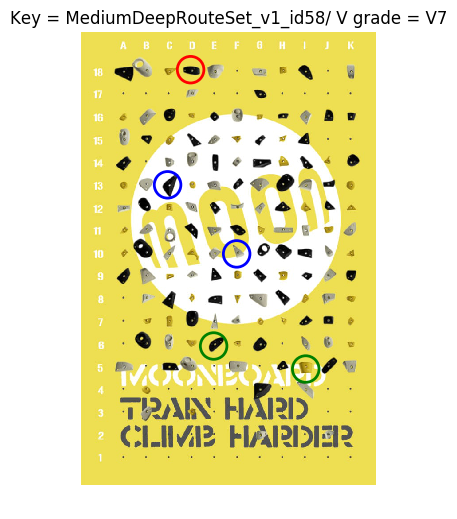

Key = MediumDeepRouteSet_v1_id59
V grade = V6


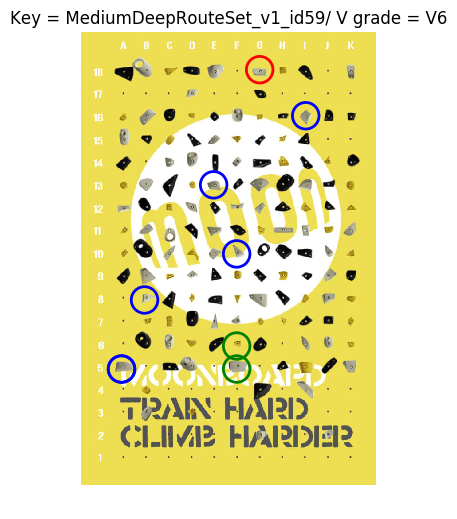

Key = MediumDeepRouteSet_v1_id60
V grade = V8


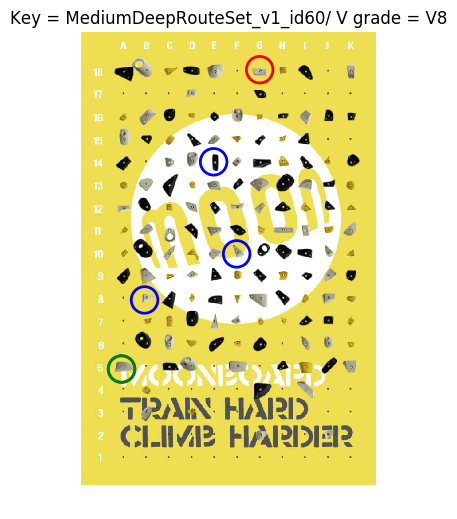

Key = MediumDeepRouteSet_v1_id61
V grade = V6


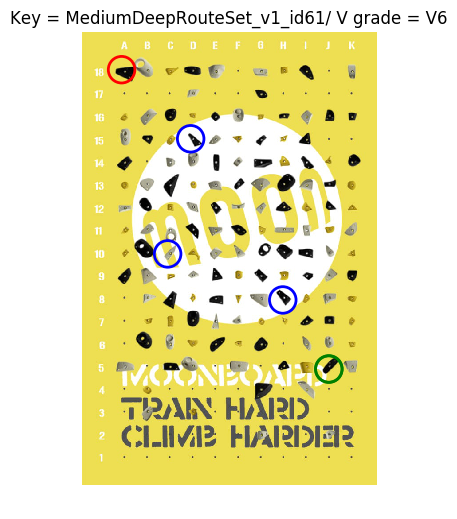

Key = MediumDeepRouteSet_v1_id62
V grade = V6


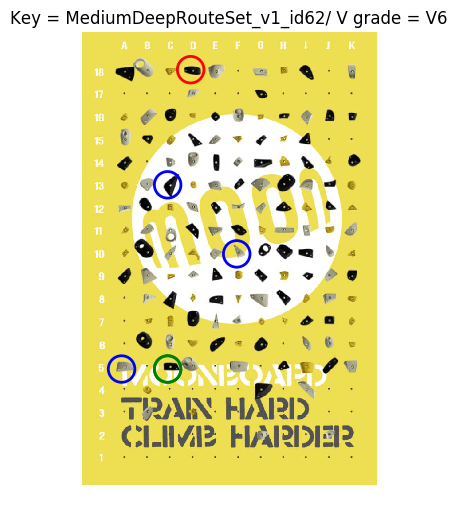

Key = MediumDeepRouteSet_v1_id63
V grade = V8


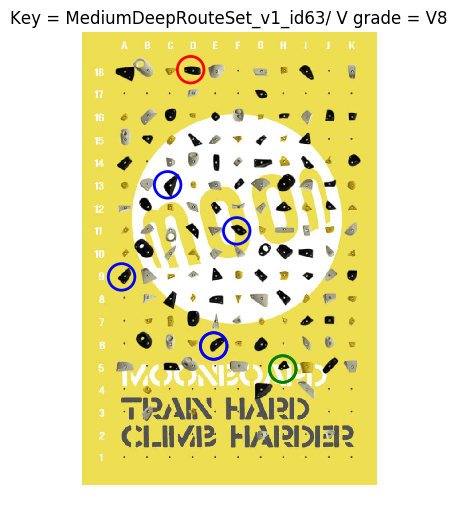

Key = MediumDeepRouteSet_v1_id64
V grade = V6


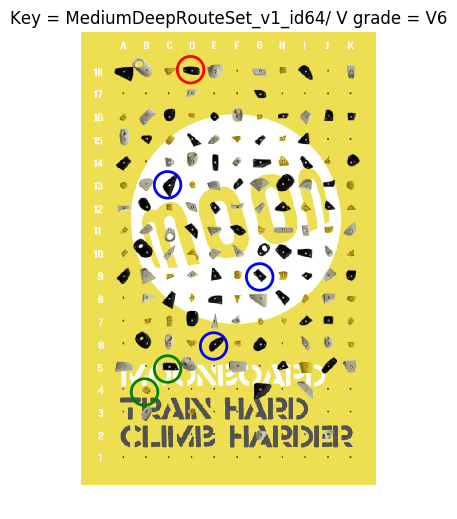

Key = MediumDeepRouteSet_v1_id65
V grade = V5


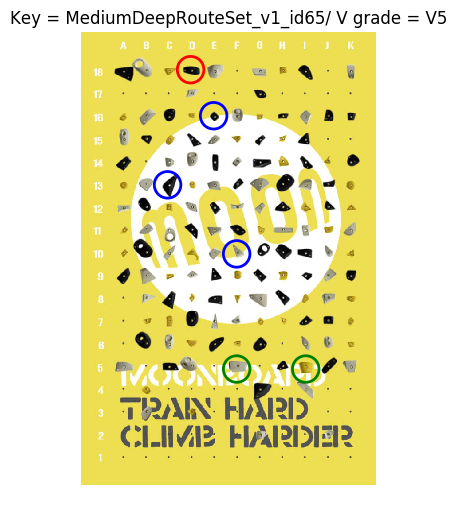

In [26]:
for i, route in enumerate(gen_seq_raw):
    print('Key = ' + test_set['keys'][i])
    print('V grade = ' + convert_num_to_V_grade(test_Y_gen[i]))
    plotAProblem(route, 
                 title = 'Key = ' + test_set['keys'][i] + '/ V grade = ' + convert_num_to_V_grade(test_Y_gen[i]), key = test_set['keys'][i], 
                 save = True)